# Imports

In [4]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML


from torchvision.utils import save_image

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [32]:
KAGGLE_CONFIG_DIR = 'kaggle.json'
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/fresh-rotten-fruits/Kaggle"

In [34]:
!kaggle datasets download -d arnaud58/landscape-pictures

/bin/bash: kaggle: command not found


**Resume Training**

Check saved model to resume training

# Inputs
------




In [6]:
# Number of workers for dataloader
workers = 4

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 2500

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

## Load Data

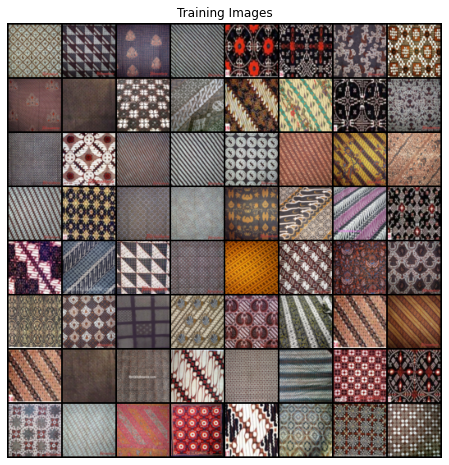

In [17]:

# Root directory for dataset
dir_base = "../dcgan-pytorch-gcp"
dataroot = "%s/data/batik-classification/"%(dir_base)

dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Implementation
--------------






## Weight Init

In [18]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## Generator

In [19]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [20]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


## Discriminator 



In [21]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

Now, as with the generator, we can create the discriminator, apply the
``weights_init`` function, and print the model’s structure.




In [22]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


## Loss Function and Optimizer

In [23]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

## Load Model

In [26]:
from datetime import date
today = date.today()

#costum_name = '1' 
#model_load_path = 'saved_models/%s/%s_%s.pth'%(today,today,costum_name)
model_load_path = '%s/saved_models/2020-07-09_kcv-its-2500e-bcd-600e_2.pth'%(dir_base)

checkpoint = torch.load(model_load_path)

In [27]:
epoch = checkpoint['epoch']
netG.load_state_dict(checkpoint['generator_state_dict'])
netD.load_state_dict(checkpoint['discriminator_state_dict'])
optimizerG.load_state_dict(checkpoint['optimizer_G_state_dict'])
optimizerD.load_state_dict(checkpoint['optimizer_D_state_dict'])
errG = checkpoint['G_loss']
errD = checkpoint['D_loss']
#img_list = checkpoint['img_list'] #load img_list

In [28]:
print('last epoch: ', epoch)
print('num_epochs: ',num_epochs)

last epoch:  3100
num_epochs:  2500


In [29]:
# Custom epoch
#epoch = 0
num_epochs= 4000

## Training

In [30]:
# Training Loop

# Lists to keep track of progress
# Uncomment img_list if start from 0
img_list = [] 
G_losses = []
D_losses = []
iters = 0
list_counter = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(epoch, num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
                
                #save individual real image
                for i in range(real_cpu.size(0)):
                    if not os.path.exists('%s/real/epoch_%d'%(dir_base,epoch)):
                        os.makedirs('%s/real/epoch_%d'%(dir_base,epoch))
                        
                    real_name = '%s/real/epoch_%d/real_%d_%d_%d.jpg'%(dir_base, epoch, epoch, iters, i)
                    
                    save_image(real_cpu[i], real_name, normalize=True)
                
                #Save individual fake image
                for i in range(fake.size(0)):
                    if not os.path.exists('%s/fake/epoch_%d'%(dir_base,epoch)):
                        os.makedirs('%s/fake/epoch_%d'%(dir_base,epoch))
                        
                    fake_name = '%s/fake/epoch_%d/fake_%d_%d_%d.jpg'%(dir_base,epoch, epoch, iters, i)
                    save_image(fake[i], fake_name, normalize=True)
                
            #List for making Grid        
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            #save img_list
            if not os.path.exists('%s/img_list'%(dir_base)):
                os.makedirs('%s/img_list'%(dir_base))

            img_list_name = '%s/img_list/img_list_%d_%d_%d.jpg'%(dir_base, epoch, iters, i)
            save_image(img_list[list_counter], img_list_name)
            list_counter+=1
            
        iters += 1

Starting Training Loop...
[3100/4000][0/5]	Loss_D: 0.0027	Loss_G: 7.5634	D(x): 0.9997	D(G(z)): 0.0025 / 0.0009
[3101/4000][0/5]	Loss_D: 0.0424	Loss_G: 7.5126	D(x): 0.9998	D(G(z)): 0.0405 / 0.0019
[3102/4000][0/5]	Loss_D: 0.0084	Loss_G: 6.2468	D(x): 0.9990	D(G(z)): 0.0074 / 0.0034
[3103/4000][0/5]	Loss_D: 0.2776	Loss_G: 12.8923	D(x): 0.9979	D(G(z)): 0.2196 / 0.0002
[3104/4000][0/5]	Loss_D: 0.2693	Loss_G: 9.1178	D(x): 0.9961	D(G(z)): 0.1146 / 0.0055
[3105/4000][0/5]	Loss_D: 0.0863	Loss_G: 6.0468	D(x): 0.9350	D(G(z)): 0.0082 / 0.0144
[3106/4000][0/5]	Loss_D: 0.0525	Loss_G: 6.2702	D(x): 0.9721	D(G(z)): 0.0215 / 0.0103
[3107/4000][0/5]	Loss_D: 0.0066	Loss_G: 10.4698	D(x): 0.9976	D(G(z)): 0.0042 / 0.0006
[3108/4000][0/5]	Loss_D: 0.0135	Loss_G: 6.8862	D(x): 0.9990	D(G(z)): 0.0123 / 0.0025
[3109/4000][0/5]	Loss_D: 0.0123	Loss_G: 6.1451	D(x): 0.9996	D(G(z)): 0.0117 / 0.0030
[3110/4000][0/5]	Loss_D: 0.0126	Loss_G: 6.7438	D(x): 0.9923	D(G(z)): 0.0048 / 0.0015
[3111/4000][0/5]	Loss_D: 0.0289	Loss_

KeyboardInterrupt: 

### Manual save img_list

In [ ]:
if not os.path.exists('%s/img_list'%(dir_base)):
    os.makedirs('%s/img_list'%(dir_base))
j=0
for i in img_list:
    img_list_name = '%s/img_list/img_list_%d.jpg'%(dir_base,j)
    save_image(i, img_list_name)
    j+=1

In [ ]:
#save individual real image
for i in range(real_cpu.size(0)):
    if not os.path.exists('%s/real/epoch_%d'%(dir_base,epoch)):
        os.makedirs('%s/real/epoch_%d'%(dir_base,epoch))
        
    real_name = '%s/real/epoch_%d/real_%d_%d_%d.jpg'%(dir_base, epoch, epoch, iters, i)
    
    save_image(real_cpu[i], real_name, normalize=True)

In [24]:
fake = netG(fixed_noise).detach().cpu()
                
#Save individual fake image
for i in range(fake.size(0)):
    if not os.path.exists('%s/fake/epoch_%d'%(dir_base,epoch)):
        os.makedirs('%s/fake/epoch_%d'%(dir_base,epoch))
        
    fake_name = '%s/fake/epoch_%d/fake_%d_%d_%d.jpg'%(dir_base,epoch, epoch, iters, i)
    save_image(fake[i], fake_name, normalize=True)

## Save Model

In [ ]:

from datetime import date
today = date.today()

if not os.path.exists('%s/saved_models/%s'%(dir_base, today)):
    os.makedirs('%s/saved_models/%s'%(dir_base, today))
    
costum_name = 'batik-combined-2500e'   
model_save_path = '%s/saved_models/%s/%s_%s.pth'%(dir_base, today,today,costum_name)



In [ ]:
#save with img_list (larger file)
torch.save({
            'epoch': epoch,
            'generator_state_dict': netG.state_dict(),
            'discriminator_state_dict': netD.state_dict(),
            'optimizer_G_state_dict': optimizerG.state_dict(),
            'optimizer_D_state_dict': optimizerD.state_dict(),
            'G_loss': errG.item(),
            'D_loss': errD.item(),
            'img_list':img_list
            }, model_save_path)

# Results
-------


### Result Function

In [ ]:
def plot_graph():
  plt.figure(figsize=(10,5))
  plt.title("Loss Generator & Discriminator")
  plt.plot(G_losses,label="G")
  plt.plot(D_losses,label="D")
  plt.xlabel("iterations")
  plt.ylabel("Loss")
  plt.legend()
  plt.show()
def plot_gif():
  fig = plt.figure(figsize=(8,8))
  plt.axis("off")
  ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
  ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

  HTML(ani.to_jshtml())
def plot_real_v_fake():
  real_batch = next(iter(dataloader))

  # Plot the real images
  plt.figure(figsize=(15,15))
  plt.subplot(1,2,1)
  plt.axis("off")
  plt.title("Citra Asli")
  plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

  # Plot the fake images from the last epoch
  plt.subplot(1,2,2)
  plt.axis("off")
  plt.title("Citra Palsu")
  plt.imshow(np.transpose(img_list[-1],(1,2,0)))
  plt.show()

## 2020-07-08 - KCV-ITS

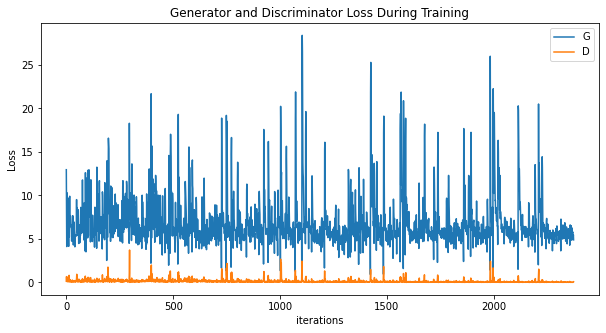

Animation size has reached 21517145 bytes, exceeding the limit of 20971520.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


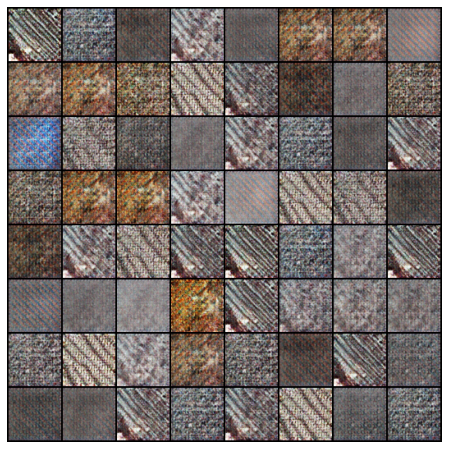

In [ ]:
plot_graph()
plot_gif()

## 2020-07-09 - Batik Classification Dataset (BCD)

In [ ]:
  fig = plt.figure(figsize=(8,8))
  plt.axis("off")
  ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
  ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

  HTML(ani.to_jshtml())

Output hidden; open in https://colab.research.google.com to view.

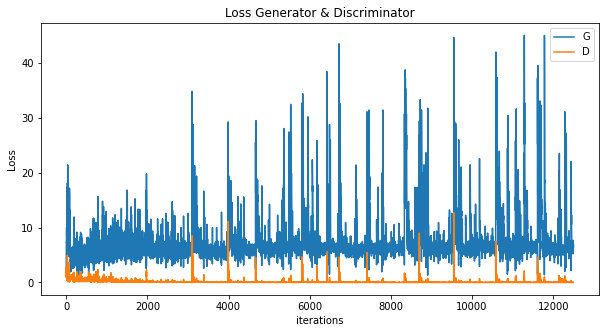

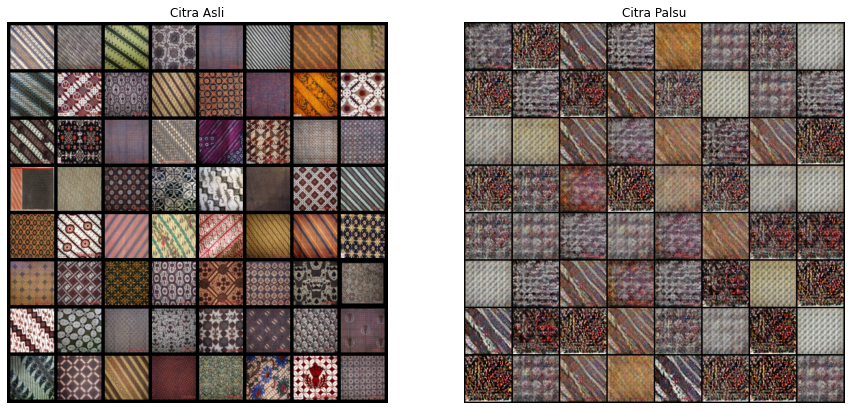

In [ ]:
plot_graph()
plot_real_v_fake()

## 2020-07-09 - BCD-2500e & KCV-ITS-500e

In [ ]:
  fig = plt.figure(figsize=(8,8))
  plt.axis("off")
  ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
  ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

  HTML(ani.to_jshtml())

Output hidden; open in https://colab.research.google.com to view.

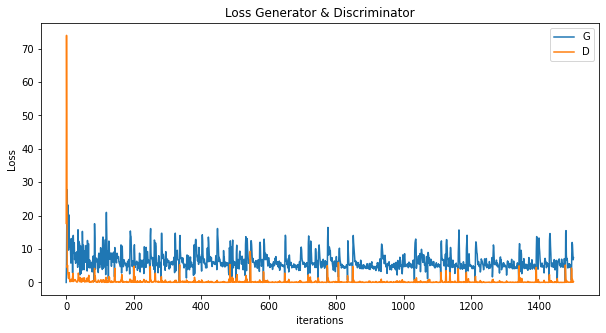

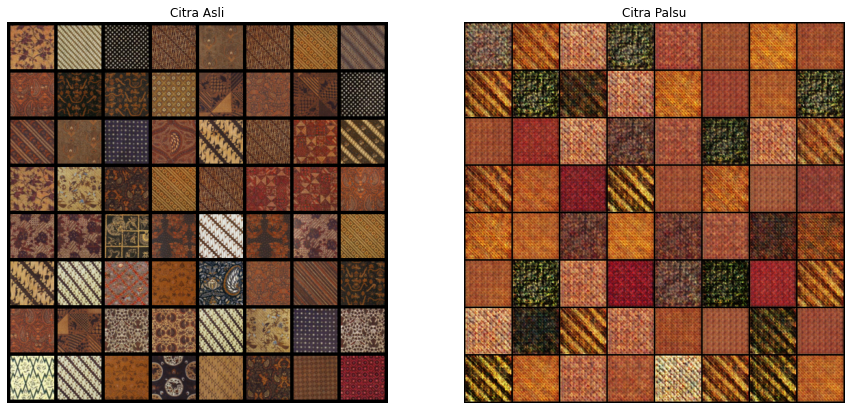

In [ ]:
plot_graph()
plot_real_v_fake()

## 2020-07-09 KCV-ITS-2500e-2nd

In [ ]:
  fig = plt.figure(figsize=(8,8))
  plt.axis("off")
  ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
  ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

  HTML(ani.to_jshtml())

Output hidden; open in https://colab.research.google.com to view.

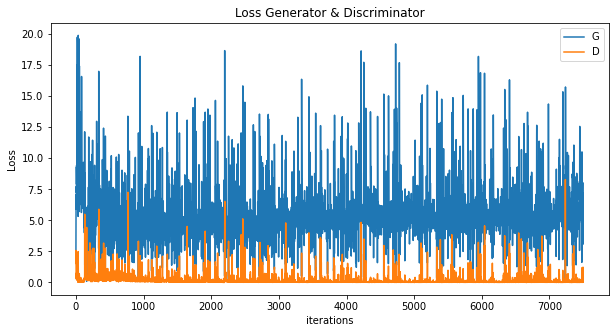

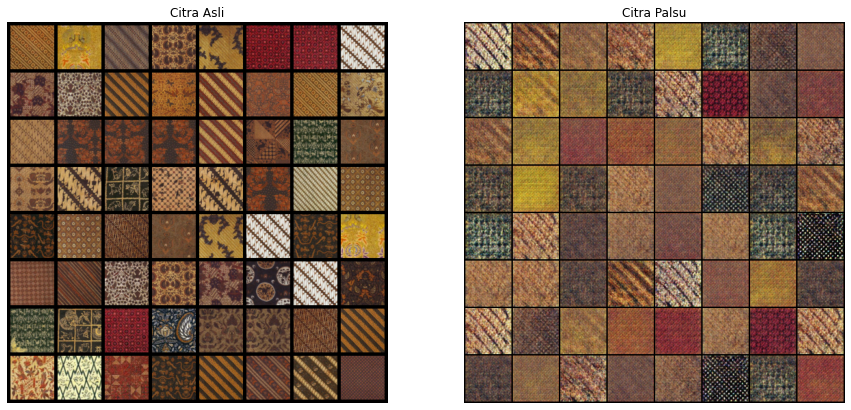

In [ ]:
plot_graph()
plot_real_v_fake()

## 2020-07-09 KCV-ITS-2500e & BCD-600e

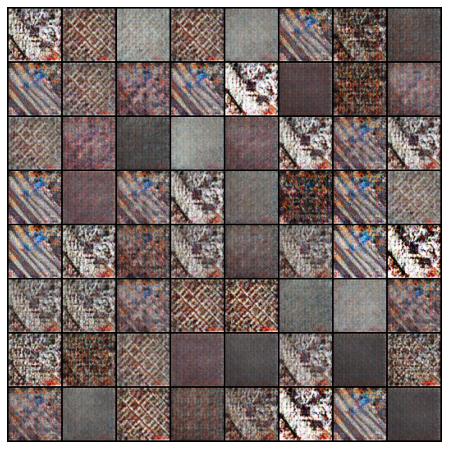

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

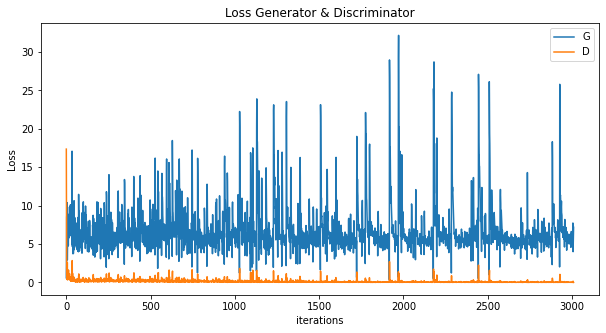

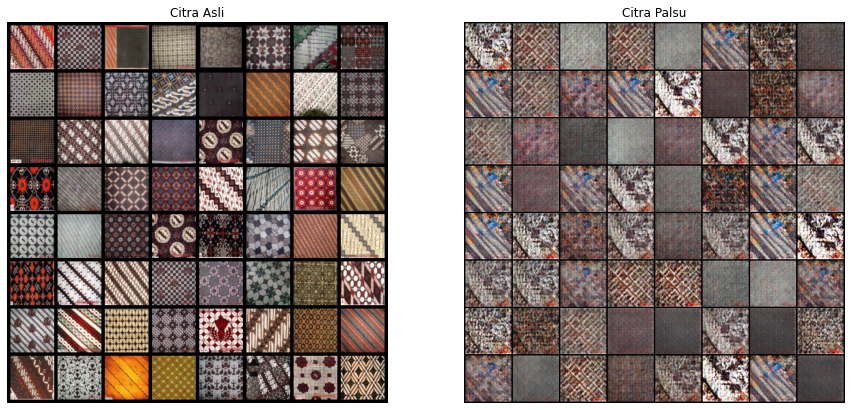

In [ ]:
plot_graph()
plot_real_v_fake()

## 2020-07-10 Batik Combined 2500e

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

Output hidden; open in https://colab.research.google.com to view.

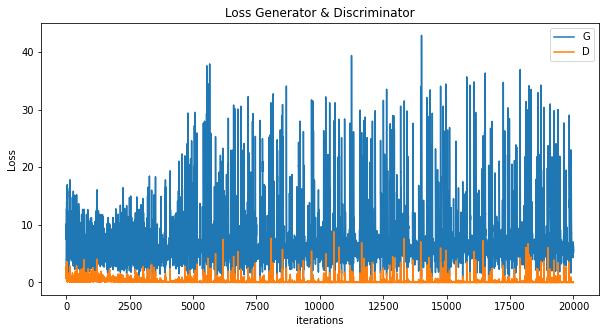

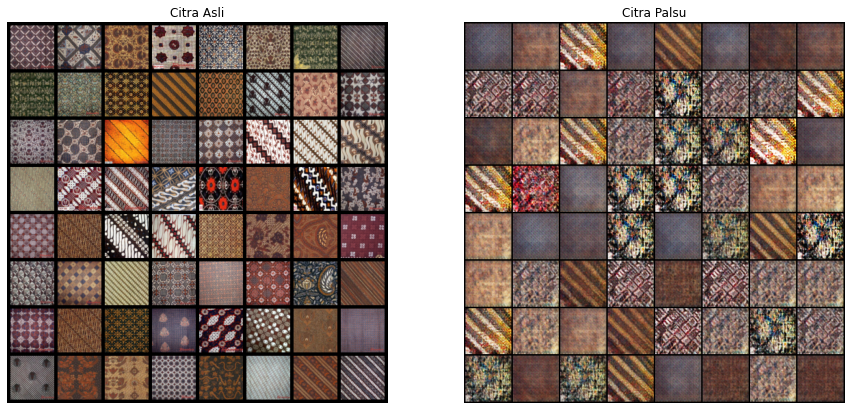

In [ ]:
plot_graph()
plot_real_v_fake()